# Machine Learning A-Z: Section 14 Logistic Regression

In Part 2 of the course we focused on various types of regression models that would estimate a real number for an unknown input. This is great for when we want our model to estimate things such as cost, salary, weight, duration, etc. However, often times want the output of our model to be a classification of the item such as boy/girl, success/fail, apple/orange, etc. Part 3 of this course will consider models designed to provide classifications of the inputs. In this section we'll start with logistic regresion. 

Logistic regression is similar to linear and polynomial regression in that it is trying to find a logistic function that best fits the data. However unlike previous regressions, logistic regression does not directly output a real number but rather the probability that a an input belongs to a given class. Typically in-order to get the final predictied classification, we pick some probability (say 50%) and anthing above it gets is classified as __A__ and everything below is is classified as __B__.

For our example problem, we are going to be looking at social media ads and build a model that will estimate the probability of a user buying the product based on some basic information about the person.


## Step 1 Import and Prepare the data.

In [21]:
import numpy as np # Libraries for fast linear algebra and array manipulation
import pandas as pd # Import and manage datasets
from plotly import __version__ as py__version__
import plotly.express as px # Libraries for ploting data
import plotly.graph_objects as go # Libraries for ploting data
from sklearn import __version__ as skl__version__
from sklearn.model_selection import train_test_split # Library to split data into training and test sets.
from sklearn.preprocessing import StandardScaler # Library to do feature scaling
from sklearn.linear_model import LogisticRegression # Library to do logistic regression
from sklearn.metrics import confusion_matrix #Function for computing the confusion matrix

Library versions used in this code:

In [22]:
print('Numpy: ' + np.__version__)
print('Pandas: ' + pd.__version__)
print('Plotly: ' + py__version__)
print('Scikit-learn: ' + skl__version__)

Numpy: 1.16.4
Pandas: 0.25.1
Plotly: 4.0.0
Scikit-learn: 0.21.2


In [23]:
def LoadData():
    dataset = pd.read_csv('Social_Network_Ads.csv')
    return dataset

dataset = LoadData()
print(dataset.head(3))
print()
print(dataset.info())

    User ID  Gender  Age  EstimatedSalary  Purchased
0  15624510    Male   19            19000          0
1  15810944    Male   35            20000          0
2  15668575  Female   26            43000          0

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 5 columns):
User ID            400 non-null int64
Gender             400 non-null object
Age                400 non-null int64
EstimatedSalary    400 non-null int64
Purchased          400 non-null int64
dtypes: int64(4), object(1)
memory usage: 15.8+ KB
None


In [24]:
X = dataset.iloc[:,2:-1].values # All the columns except the last are features
y = dataset.iloc[:,-1].values # The last column is the dependent variable

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.25, random_state = 42)

sc_X = StandardScaler()
X_train = sc_X.fit_transform(X_train)
X_test = sc_X.transform(X_test)

#print(X_train)
#print()
#print(X_test)

Notes about the preprocessing:
* We skipped the following sections of preprocessing:
  * Missing Data - The dataset is complete with no missing data
  * Categorical Data - We are not using categorical data in our dataset

## Step 2: Fit a Logistic Regression Model
Below we fit a Logistic Regression model to the scaled training data

In [25]:
classifier = LogisticRegression(random_state = 42, solver = 'liblinear')
classifier.fit(X_train, y_train)

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=42, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

## Step 3: Evaluate the Model Performance
Evaluate the performance of the model on the test data that was held back

In [27]:
y_pred = classifier.predict(X_test)

confusionMatrix = confusion_matrix(y_test, y_pred)

print(confusionMatrix)

array([[61,  2],
       [10, 27]])

The confusion matrix function is a way of looking at the model's performance. It tells us how many were correctly predicted to not buy the product and actually didn't (61), how many were predicted to not buy, but actually did (2), how many were predicted to buy the product but didn't (10), and how many were predicted to buy the product and actually did (27). These are called respectively: true negative rate, false negative rate, false positive rate, true positive rate. It gives us an idea of how well our model does as well as where it tends to struggle. In our case, it does pretty well (correctly predicting 89%) and on the ones it missed it tends to be a little optimistic about who will buy.

## Step 4: Visualize the model
Below we'll visualize the results of the model to get a better of idea of who the model predicts will purchase our product.

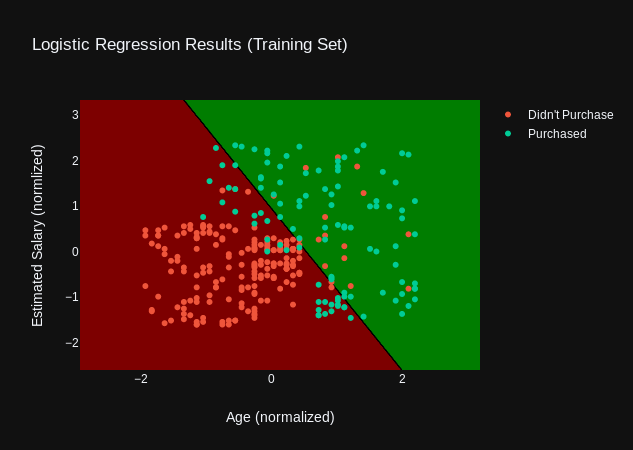

In [67]:
X_set, y_set, step = X_train, y_train, 0.01
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = step),
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = step))
mesh_pred = classifier.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape)

fig = go.Figure(data = 
    go.Contour(
        z=mesh_pred,
        dx=step,
        dy=step,
        x0=X1.min(),
        y0=X2.min(),
        showscale = False,
        colorscale = [[0, 'rgb(125,0,0)'], [1, 'rgb(0,125,0)']]),
    layout = {
        'template': 'plotly_dark',
        'title': 'Logistic Regression Results (Training Set)',
        'xaxis': {'title': {'text': 'Age (normalized)'}},
        'yaxis': {'title': {'text': 'Estimated Salary (normlized)'}}
             })

fig.add_trace(
    go.Scatter(
        x = X_set[y_set == 0,0],
        y = X_set[y_set == 0,1],
        name = 'Didn\'t Purchase',
        mode = 'markers'))

fig.add_trace(
    go.Scatter(
        x = X_set[y_set == 1,0],
        y = X_set[y_set == 1,1],
        name = 'Purchased',
        mode = 'markers'))


fig.show()

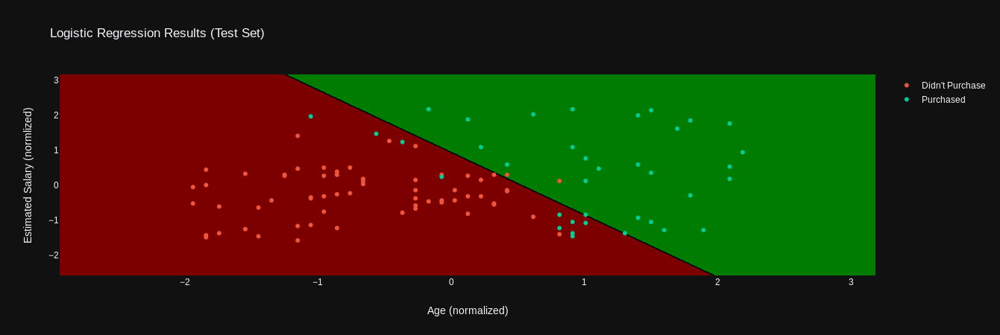

In [68]:
X_set, y_set, step = X_test, y_test, 0.01
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = step),
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = step))
mesh_pred = classifier.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape)

fig = go.Figure(data = 
    go.Contour(
        z=mesh_pred,
        dx=step,
        dy=step,
        x0=X1.min(),
        y0=X2.min(),
        showscale = False,
        colorscale = [[0, 'rgb(125,0,0)'], [1, 'rgb(0,125,0)']]),
    layout = {
        'template': 'plotly_dark',
        'title': 'Logistic Regression Results (Test Set)',
        'xaxis': {'title': {'text': 'Age (normalized)'}},
        'yaxis': {'title': {'text': 'Estimated Salary (normlized)'}}
             })

fig.add_trace(
    go.Scatter(
        x = X_set[y_set == 0,0],
        y = X_set[y_set == 0,1],
        name = 'Didn\'t Purchase',
        mode = 'markers'))

fig.add_trace(
    go.Scatter(
        x = X_set[y_set == 1,0],
        y = X_set[y_set == 1,1],
        name = 'Purchased',
        mode = 'markers'))


fig.show()

In the plots about we notice a couple things.
1. People who purchased the product seemed to be either above average age, above average salary, or both.
1. Logistic Regression is a linear regression and hence produces a line (with 2 independent variables, or a plane with 3, hyper plane with 4+, etc.)
1. The didvision between our two groups doesn't appear to be linear, so a non-linear classifier may perform better.
1. Even though our model is linear and the true classification appears non-linear, our model still did a pretty good job; correctly predicting 89% of the test set.